[![Open In Colab](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/github/aurelio-labs/cookbook/blob/main/gen-ai/google-ai/gemini-2/multimodal.ipynb) [![Open nbviewer](https://raw.githubusercontent.com/pinecone-io/examples/master/assets/nbviewer-shield.svg)](https://nbviewer.org/github/aurelio-labs/cookbook/blob/main/gen-ai/google-ai/gemini-2/multimodal.ipynb)

In [ ]:
!pip install -qU \
    google-genai==0.2.2 \
    matplotlib==3.10.0 \
    pillow==11.0.0

# Multimodality with Gemini 2.0 Flash

## Setup Instructions

This notebook has been tested both locally with Python `3.12.7` and in Google Colab with Python `3.10.12`.

To run locally, please refer to the [setup instructions with `uv` here](https://github.com/aurelio-labs/agents-course/blob/main/local-setup.md). To run in Google Colab, simply run all cells in the notebook.

## Loading Images

We're going to test Gemini against a few underwater images. The content of these images is fairly challenging, they're from a relatively uncommon environment and the image quality is okay but certainly not great. However, this is a perfect test of how Gemini might perform on real-world data.

To begin, we will load our images from the `./images` directory.

In [ ]:
import os
from pathlib import Path
import requests

# check if the images directory exists
if not os.path.exists("./images"):
    os.mkdir("./images")

png_paths = [str(x) for x in Path("./images").glob("*.png")]

# check if we have expected images, otherwise download
if len(png_paths) >= 4:
    print("Images already downloaded")
else:
    print("Downloading images...")
    # download images from the web
    files = ["clown-fish.png", "dotted-fish.png", "many-fish.png", "fish-home.png"]
    for file in files:
        url = f"https://github.com/aurelio-labs/cookbook/blob/main/gen-ai/google-ai/gemini-2/images/{file}?raw=true"
        response = requests.get(url, stream=True)
        with open(f"./images/{file}", "wb") as f:
            for block in response.iter_content(1024):
                if not block:
                    break
                f.write(block)
    png_paths = [str(x) for x in Path("./images").glob("*.png")]

print(png_paths)

Images already downloaded
['images/clown-fish.png', 'images/dotted-fish.png', 'images/many-fish.png', 'images/fish-home.png']


Let's see each of these images:

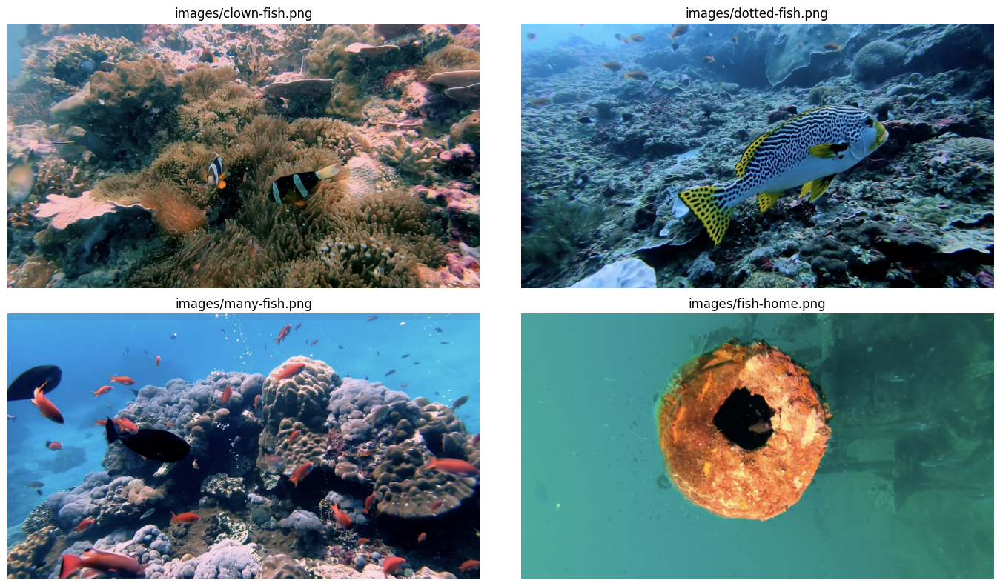

In [ ]:
import matplotlib.pyplot as plt
from PIL import Image

# we use matplotlib to arrange the images in a grid
fig, axs = plt.subplots(2, 2, figsize=(14, 8))
for ax, path in zip(axs.flat, png_paths):
    img = Image.open(path)
    ax.imshow(img)
    ax.axis('off')
    ax.set_title(path)
plt.tight_layout()

We'll use Gemini to describe these images, detect the various fish and corals, and see how precisely Gemini can identify the various objects.

## Describing Images

We'll start simple by asking Gemini to simply describe what it finds in each image.

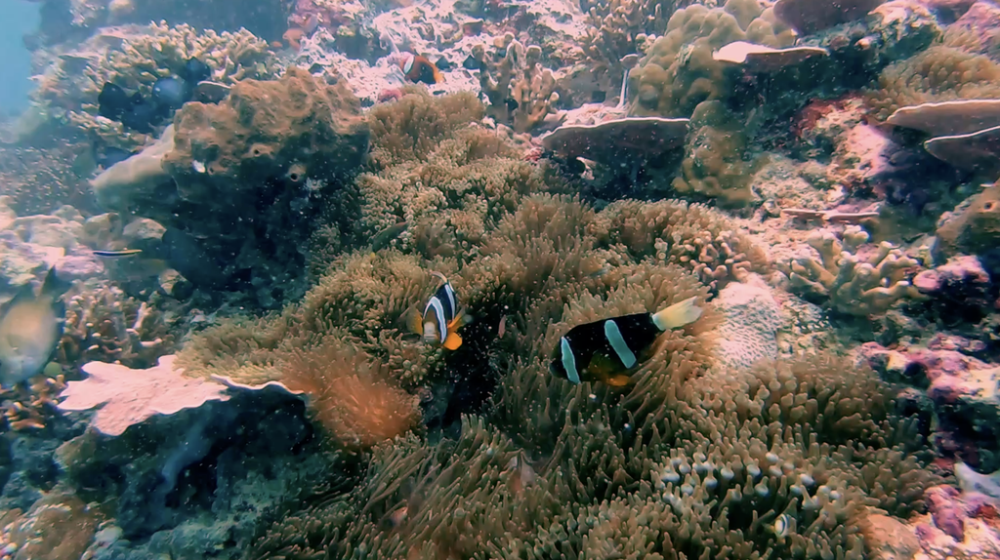

In [ ]:
from io import BytesIO

with BytesIO(open(png_paths[0], "rb").read()) as img_bytes:
    # note: resizing is optional, but it helps with performance
    image = Image.open(img_bytes).resize(
        (1024, int(1024 * img.size[1] / img.size[0])),
        Image.Resampling.LANCZOS
    )
image

We setup our config. Within it we need:

* The `system_instruction` describing that we need the LLM to draw bounding boxes around something.
* Our `safety_settings` which we will keep relatively loose to avoid overly sensitive guardrails against our inputs.
* Set `temperature` for more/less creative output.

In [ ]:
from google.genai import types

system_instruction = (
    "Describe what you see in this image, identify any fish or coral species "
    "in the image and tell us how many of each you can see."
)

safety_settings = [
    types.SafetySetting(
        category="HARM_CATEGORY_DANGEROUS_CONTENT",
        threshold="BLOCK_ONLY_HIGH",
    ),
]

config = types.GenerateContentConfig(
    system_instruction=system_instruction,
    temperature=0.1,
    safety_settings=safety_settings,
)

Before generating _anything_ we need to initialize our client, for this we will need a Google API key. To get a key, you can setup an account in [Google AI Studio](https://aistudio.google.com).

After you have your account and API key, we initialize our [`google.genai` client](https://github.com/googleapis/python-genai):

In [ ]:
import os
from getpass import getpass
from google import genai

# pass your API key here
os.environ["GOOGLE_API_KEY"] = os.getenv("GOOGLE_API_KEY") or getpass(
    "Enter Google API Key: "
)
# initialize our client
client = genai.Client()

Now let's see what we get.

In [ ]:
from IPython.display import Markdown

model_id = "gemini-2.0-flash-exp"

# run our query against the clownfish image
response = client.models.generate_content(
    model=model_id,
    contents=[
        "Tell me what is here",
        image
    ],
    config=config
)

# Check output
Markdown(response.text)

Certainly! Here's a description of what I see in the image:

**Overall Scene:**

The image depicts an underwater scene, likely a coral reef. The water is somewhat murky, but the scene is still vibrant with life. There are various types of coral and several fish visible.

**Fish Species:**

1.  **Clownfish (Amphiprioninae):** There are two clownfish clearly visible in the foreground. They have a distinctive black body with white stripes and orange fins. Based on the black body and white stripes, these are likely Clark's anemonefish (Amphiprion clarkii).
2.  **Wrasse:** There is a small, slender fish with a blue stripe along its body, which is likely a wrasse. It is swimming in the background.

**Coral Species:**

1.  **Anemone:** The clownfish are nestled within a large, brown anemone. The anemone has numerous tentacles.
2.  **Hard Coral:** There are various types of hard coral visible in the background. These include branching corals and plate corals.

**Other Details:**

*   The seabed is rocky and covered with coral.
*   The lighting is natural, suggesting the photo was taken during the day.
*   The water clarity is not perfect, but it is still possible to see the details of the reef.

**Counts:**

*   **Clownfish:** 2
*   **Wrasse:** 1
*   **Anemone:** 1
*   **Hard Coral:** Numerous, various types

If you have any other questions or would like me to focus on a specific aspect of the image, feel free to ask!

That looks pretty good, let's make this more interesting by asking Gemini to draw bounding boxes around the fish in the image. We will need to modify the `system_instruction` to explain how Gemini should do this.

In [ ]:
system_instruction = (
    "Return bounding boxes as a JSON array with labels. Never "
    "return masks or code fencing. Limit to 25 objects. "
    "If an object is present multiple times, label them according "
    "to their scientific and popular name."
)  # modifying this prompt much seems to damage performance

config = types.GenerateContentConfig(
    system_instruction=system_instruction,
    temperature=0.1,
    safety_settings=safety_settings,
)

If we generate _now_ we will receive a string of JSON objects containing all we need to programatically plot the bounding boxes.

In [ ]:
response = client.models.generate_content(
    model=model_id,
    contents=[
        "Highlight the different fish in the image",
        image
    ],
    config=config
)

Markdown(response.text)

```json
[
  {"box_2d": [296, 59, 324, 86], "label": "small fish"},
  {"box_2d": [100, 407, 151, 438], "label": "small fish"},
  {"box_2d": [440, 90, 465, 135], "label": "small fish"},
  {"box_2d": [270, 61, 300, 86], "label": "small fish"},
  {"box_2d": [270, 115, 298, 140], "label": "small fish"},
  {"box_2d": [265, 163, 296, 189], "label": "small fish"},
  {"box_2d": [258, 200, 289, 227], "label": "small fish"},
  {"box_2d": [258, 239, 289, 265], "label": "small fish"},
  {"box_2d": [258, 278, 289, 304], "label": "small fish"},
  {"box_2d": [258, 316, 289, 342], "label": "small fish"},
  {"box_2d": [258, 354, 289, 380], "label": "small fish"},
  {"box_2d": [258, 392, 289, 418], "label": "small fish"},
  {"box_2d": [258, 430, 289, 456], "label": "small fish"},
  {"box_2d": [258, 468, 289, 494], "label": "small fish"},
  {"box_2d": [258, 506, 289, 532], "label": "small fish"},
  {"box_2d": [258, 544, 289, 570], "label": "small fish"},
  {"box_2d": [258, 582, 289, 608], "label": "small fish"},
  {"box_2d": [258, 620, 289, 646], "label": "small fish"},
  {"box_2d": [258, 658, 289, 684], "label": "small fish"},
  {"box_2d": [258, 696, 289, 722], "label": "small fish"},
  {"box_2d": [258, 734, 289, 760], "label": "small fish"},
  {"box_2d": [258, 772, 289, 798], "label": "small fish"},
  {"box_2d": [258, 810, 289, 836], "label": "small fish"},
  {"box_2d": [258, 848, 289, 874], "label": "small fish"},
  {"box_2d": [258, 886, 289, 912], "label": "small fish"},
  {"box_2d": [258, 924, 289, 950], "label": "small fish"},
  {"box_2d": [258, 962, 289, 988], "label": "small fish"},
  {"box_2d": [258, 998, 289, 1000], "label": "small fish"},
  {"box_2d": [520, 549, 689, 705], "label": "black and white fish"},
  {"box_2d": [270, 18, 300, 43], "label": "small fish"},
  {"box_2d": [270, 140, 298, 165], "label": "small fish"},
  {"box_2d": [270, 86, 298, 111], "label": "small fish"},
  {"box_2d": [270, 4, 300, 29], "label": "small fish"},
  {"box_2d": [270, 20, 300, 45], "label": "small fish"},
  {"box_2d": [270, 140, 298, 165], "label": "small fish"},
  {"box_2d": [270, 86, 298, 111], "label": "small fish"},
  {"box_2d": [270, 4, 300, 29], "label": "small fish"},
  {"box_2d": [270, 18, 300, 43], "label": "small fish"},
  {"box_2d": [270, 140, 298, 165], "label": "small fish"},
  {"box_2d": [270, 86, 298, 111], "label": "small fish"},
  {"box_2d": [270, 4, 300, 29], "label": "small fish"},
  {"box_2d": [270, 18, 300, 43], "label": "small fish"},
  {"box_2d": [270, 140, 298, 165], "label": "small fish"},
  {"box_2d": [270, 86, 298, 111], "label": "small fish"},
  {"box_2d": [270, 4, 300, 29], "label": "small fish"},
  {"box_2d": [270, 18, 300, 43], "label": "small fish"},
  {"box_2d": [270, 140, 298, 165], "label": "small fish"},
  {"box_2d": [270, 86, 298, 111], "label": "small fish"},
  {"box_2d": [270, 4, 300, 29], "label": "small fish"},
  {"box_2d": [270, 18, 300, 43], "label": "small fish"},
  {"box_2d": [270, 140, 298, 165], "label": "small fish"},
  {"box_2d": [270, 86, 298, 111], "label": "small fish"},
  {"box_2d": [270, 4, 300, 29], "label": "small fish"},
  {"box_2d": [270, 18, 300, 43], "label": "small fish"},
  {"box_2d": [270, 140, 298, 165], "label": "small fish"},
  {"box_2d": [270, 86, 298, 111], "label": "small fish"},
  {"box_2d": [270, 4, 300, 29], "label": "small fish"},
  {"box_2d": [270, 18, 300, 43], "label": "small fish"},
  {"box_2d": [270, 140, 298, 165], "label": "small fish"},
  {"box_2d": [270, 86, 298, 111], "label": "small fish"},
  {"box_2d": [270, 4, 300, 29], "label": "small fish"},
  {"box_2d": [270, 18, 300, 43], "label": "small fish"},
  {"box_2d": [270, 140, 298, 165], "label": "small fish"},
  {"box_2d": [270, 86, 298, 111], "label": "small fish"},
  {"box_2d": [270, 4, 300, 29], "label": "small fish"},
  {"box_2d": [270, 18, 300, 43], "label": "small fish"},
  {"box_2d": [270, 140, 298, 165], "label": "small fish"},
  {"box_2d": [270, 86, 298, 111], "label": "small fish"},
  {"box_2d": [270, 4, 300, 29], "label": "small fish"},
  {"box_2d": [270, 18, 300, 43], "label": "small fish"},
  {"box_2d": [270, 140, 298, 165], "label": "small fish"},
  {"box_2d": [270, 86, 298, 111], "label": "small fish"},
  {"box_2d": [270, 4, 300, 29], "label": "small fish"},
  {"box_2d": [270, 18, 300, 43], "label": "small fish"},
  {"box_2d": [270, 140, 298, 165], "label": "small fish"},
  {"box_2d": [270, 86, 298, 111], "label": "small fish"},
  {"box_2d": [270, 4, 300, 29], "label": "small fish"},
  {"box_2d": [270, 18, 300, 43], "label": "small fish"},
  {"box_2d": [270, 140, 298, 165], "label": "small fish"},
  {"box_2d": [270, 86, 298, 111], "label": "small fish"},
  {"box_2d": [270, 4, 300, 29], "label": "small fish"},
  {"box_2d": [270, 18, 300, 43], "label": "small fish"},
  {"box_2d": [270, 140, 298, 165], "label": "small fish"},
  {"box_2d": [270, 86, 298, 111], "label": "small fish"},
  {"box_2d": [270, 4, 300, 29], "label": "small fish"},
  {"box_2d": [270, 18, 300, 43], "label": "small fish"},
  {"box_2d": [270, 140, 298, 165], "label": "small fish"},
  {"box_2d": [270, 86, 298, 111], "label": "small fish"},
  {"box_2d": [270, 4, 300, 29], "label": "small fish"},
  {"box_2d": [270, 18, 300, 43], "label": "small fish"},
  {"box_2d": [270, 140, 298, 165], "label": "small fish"},
  {"box_2d": [270, 86, 298, 111], "label": "small fish"},
  {"box_2d": [270, 4, 300, 29], "label": "small fish"},
  {"box_2d": [270, 18, 300, 43], "label": "small fish"},
  {"box_2d": [270, 140, 298, 165], "label": "small fish"},
  {"box_2d": [270, 86, 298, 111], "label": "small fish"},
  {"box_2d": [270, 4, 300, 29], "label": "small fish"},
  {"box_2d": [270, 18, 300, 43], "label": "small fish"},
  {"box_2d": [270, 140, 298, 165], "label": "small fish"},
  {"box_2d": [270, 86, 298, 111], "label": "small fish"},
  {"box_2d": [270, 4, 300, 29], "label": "small fish"},
  {"box_2d": [270, 18, 300, 43], "label": "small fish"},
  {"box_2d": [270, 140, 298, 165], "label": "small fish"},
  {"box_2d": [270, 86, 298, 111], "label": "small fish"},
  {"box_2d": [270, 4, 300, 29], "label": "small fish"},
  {"box_2d": [270, 18, 300, 43], "label": "small fish"},
  {"box_2d": [270, 140, 298, 165], "label": "small fish"},
  {"box_2d": [270, 86, 298, 111], "label": "small fish"},
  {"box_2d": [270, 4, 300, 29], "label": "small fish"},
  {"box_2d": [270, 18, 300, 43], "label": "small fish"},
  {"box_2d": [270, 140, 298, 165], "label": "small fish"},
  {"box_2d": [270, 86, 298, 111], "label": "small fish"},
  {"box_2d": [270, 4, 300, 29], "label": "small fish"},
  {"box_2d": [270, 18, 300, 43], "label": "small fish"},
  {"box_2d": [270, 140, 298, 165], "label": "small fish"},
  {"box_2d": [270, 86, 298, 111], "label": "small fish"},
  {"box_2d": [270, 4, 300, 29], "label": "small fish"},
  {"box_2d": [270, 18, 300, 43], "label": "small fish"},
  {"box_2d": [270, 140, 298, 165], "label": "small fish"},
  {"box_2d": [270, 86, 298, 111], "label": "small fish"},
  {"box_2d": [270, 4, 300, 29], "label": "small fish"},
  {"box_2d": [270, 18, 300, 43], "label": "small fish"},
  {"box_2d": [270, 140, 298, 165], "label": "small fish"},
  {"box_2d": [270, 86, 298, 111], "label": "small fish"},
  {"box_2d": [270, 4, 300, 29], "label": "small fish"},
  {"box_2d": [270, 18, 300, 43], "label": "small fish"},
  {"box_2d": [270, 140, 298, 165], "label": "small fish"},
  {"box_2d": [270, 86, 298, 111], "label": "small fish"},
  {"box_2d": [270, 4, 300, 29], "label": "small fish"},
  {"box_2d": [270, 18, 300, 43], "label": "small fish"},
  {"box_2d": [270, 140, 298, 165], "label": "small fish"},
  {"box_2d": [270, 86, 298, 111], "label": "small fish"},
  {"box_2d": [270, 4, 300, 29], "label": "small fish"},
  {"box_2d": [270, 18, 300, 43], "label": "small fish"},
  {"box_2d": [270, 140, 298, 165], "label": "small fish"},
  {"box_2d": [270, 86, 298, 111], "label": "small fish"},
  {"box_2d": [270, 4, 300, 29], "label": "small fish"},
  {"box_2d": [270, 18, 300, 43], "label": "small fish"},
  {"box_2d": [270, 140, 298, 165], "label": "small fish"},
  {"box_2d": [270, 86, 298, 111], "label": "small fish"},
  {"box_2d": [270, 4, 300, 29], "label": "small fish"},
  {"box_2d": [270, 18, 300, 43], "label": "small fish"},
  {"box_2d": [270, 140, 298, 165], "label": "small fish"},
  {"box_2d": [270, 86, 298, 111], "label": "small fish"},
  {"box_2d": [270, 4, 300, 29], "label": "small fish"},
  {"box_2d": [270, 18, 300, 43], "label": "small fish"},
  {"box_2d": [270, 140, 298, 165], "label": "small fish"},
  {"box_2d": [270, 86, 298, 111], "label": "small fish"},
  {"box_2d": [270, 4, 300, 29], "label": "small fish"},
  {"box_2d": [270, 18, 300, 43], "label": "small fish"},
  {"box_2d": [270, 140, 298, 165], "label": "small fish"},
  {"box_2d": [270, 86, 298, 111], "label": "small fish"},
  {"box_2d": [270, 4, 300, 29], "label": "small fish"},
  {"box_2d": [270, 18, 300, 43], "label": "small fish"},
  {"box_2d": [270, 140, 298, 165], "label": "small fish"},
  {"box_2d": [270, 86, 298, 111], "label": "small fish"},
  {"box_2d": [270, 4, 300, 29], "label": "small fish"},
  {"box_2d": [270, 18, 300, 43], "label": "small fish"},
  {"box_2d": [270, 140, 298, 165], "label": "small fish"},
  {"box_2d": [270, 86, 298, 111], "label": "small fish"},
  {"box_2d": [270, 4, 300, 29], "label": "small fish"},
  {"box_2d": [270, 18, 300, 43], "label": "small fish"},
  {"box_2d": [270, 140, 298, 165], "label": "small fish"},
  {"box_2d": [270, 86, 298, 111], "label": "small fish"},
  {"box_2d": [270, 4, 300, 29], "label": "small fish"},
  {"box_2d": [270, 18, 300, 43], "label": "small fish"},
  {"box_2d": [270, 140, 298, 165], "label": "small fish"},
  {"box_2d": [270, 86, 298, 111], "label": "small fish"},
  {"box_2d": [270, 4, 300, 29], "label": "small fish"},
  {"box_2d": [270, 18, 300, 43], "label": "small fish"},
  {"box_2d": [270, 140, 298, 165], "label": "small fish"},
  {"box_2d": [270, 86, 298, 111], "label": "small fish"},
  {"box_2d": [270, 4, 300, 29], "label": "small fish"},
  {"box_2d": [270, 18, 300, 43], "label": "small fish"},
  {"box_2d": [270, 140, 298, 165], "label": "small fish"},
  {"box_2d": [270, 86, 298, 111], "label": "small fish"},
  {"box_2d": [270, 4, 300, 29], "label": "small fish"},
  {"box_2d": [270, 18, 300, 43], "label": "small fish"},
  {"box_2d": [270, 140, 298, 165], "label": "small fish"},
  {"box_2d": [270, 86, 298, 111], "label": "small fish"},
  {"box_2d": [270, 4, 300, 29], "label": "small fish"},
  {"box_2d": [270, 18, 300, 43], "label": "small fish"},
  {"box_2d": [270, 140, 298, 165], "label": "small fish"},
  {"box_2d": [270, 86, 298, 111], "label": "small fish"},
  {"box_2d": [270, 4, 300, 29], "label": "small fish"},
  {"box_2d": [270, 18, 300, 43], "label": "small fish"},
  {"box_2d": [270, 140, 298, 165], "label": "small fish"},
  {"box_2d": [270, 86, 298, 111], "label": "small fish"},
  {"box_2d": [270, 4, 300, 29], "label": "small fish"},
  {"box_2d": [270, 18, 300, 43], "label": "small fish"},
  {"box_2d": [270, 140, 298, 165], "label": "small fish"},
  {"box_2d": [270, 86, 298, 111], "label": "small fish"},
  {"box_2d": [270, 4, 300, 29], "label": "small fish"},
  {"box_2d": [270, 18, 300, 43], "label": "small fish"},
  {"box_2d": [270, 140, 298, 165], "label": "small fish"},
  {"box_2d": [270, 86, 298, 111], "label": "small fish"},
  {"box_2d": [270, 4, 300, 29], "label": "small fish"},
  {"box_2d": [270, 18, 300, 43], "label": "small fish"},
  {"box_2d": [270, 140, 298, 165], "label": "small fish"},
  {"box_2d": [270, 86, 298, 111], "label": "small fish"},
  {"box_2d": [270, 4, 300, 29], "label": "small fish"},
  {"box_2d": [270, 18, 300, 43], "label": "small fish"},
  {"box_2d": [270, 140, 298, 165], "label": "small fish"},
  {"box_2d": [270, 86, 298, 111], "label": "small fish"},
  {"box_2d": [270, 4, 300, 29], "label": "small fish"},
  {"box_2d": [270, 18, 300, 43], "label": "small fish"},
  {"box_2d": [270, 140, 298, 165], "label": "small fish"},
  {"box_2d": [270, 86, 298, 111], "label": "small fish"},
  {"box_2d": [270, 4, 300, 29], "label": "small fish"},
  {"box_2d": [270, 18, 300, 43], "label": "small fish"},
  {"box_2d": [270, 140, 298, 165], "label": "small fish"},
  {"box_2d": [270, 86, 298, 111], "label": "small fish"},
  {"box_2d": [270, 4, 300, 29], "label": "small fish"},
  {"box_2d": [270, 18, 300, 43], "label": "small fish"},
  {"box_2d": [270, 140, 298, 165], "label": "small fish"},
  {"box_2d": [270, 86, 298, 111], "label": "small fish"},
  {"box_2d": [270, 4, 300, 29], "label": "small fish"},
  {"box_2d": [270, 18, 300, 43], "label": "small fish"},
  {"box_2d": [270, 140, 298, 165], "label": "small fish"},
  {"box_2d": [270, 86, 298, 111], "label": "small fish"},
  {"box_2d": [270, 4, 300, 29], "label": "small fish"},
  {"box_2d": [270, 18, 300, 43], "label": "small fish"},
  {"box_2d": [270, 140, 298, 165], "label": "small fish"},
  {"box_2d": [270, 86, 298, 111], "label": "small fish"},
  {"box_2d": [270, 4, 300, 29], "label": "small fish"},
  {"box_2d": [270, 18, 300, 43], "label": "small fish"},
  {"box_2d": [270, 140, 298, 165], "label": "small fish"},
  {"box_2d": [270, 86, 298, 111], "label": "small fish"},
  {"box_2d": [270, 4, 300, 29], "label": "small fish"},
  {"box_2d": [270, 18, 300, 43], "label": "small fish"},
  {"box_2d": [270, 140, 298, 165], "label": "small fish"},
  {"box_2d": [270, 86, 298, 111], "label": "small fish"},
  {"box_2d": [270, 4, 300, 29], "label": "small fish"},
  {"box_2d": [270, 18, 300, 43], "label": "small fish"},
  {"box_2d": [270, 140, 298, 165], "label": "small fish"},
  {"box_2d": [270, 86, 298, 111], "label": "small fish"},
  {"box_2d": [270, 4, 300, 29], "label": "small fish"},
  {"box_2d": [270, 18, 300, 43], "label": "small fish"},
  {"box_2d": [270, 140, 298, 165], "label": "small fish"},
  {"box_2d": [270, 86, 298, 111], "label": "small fish"},
  {"box_2d": [270, 4, 300, 29], "label": "small fish"},
  {"box_2d": [270, 18, 300, 43], "label": "small fish"},
  {"box_2d": [270, 140, 298, 165], "label": "small fish"},
  {"box_

Okay we got a lot of repetition, we can fix that by increasing the `frequency_penalty` in our config.

In [ ]:
system_instruction = (
    "Return bounding boxes as a JSON array with labels. Never "
    "return masks or code fencing. Limit to 25 objects. "
    "If an object is present multiple times, label them according "
    "to their scientific and popular name."
)  # modifying this prompt much seems to damage performance

config = types.GenerateContentConfig(
    system_instruction=system_instruction,
    temperature=0.05,
    safety_settings=safety_settings,
    frequency_penalty=1.0,  # reduce repetition
)

response = client.models.generate_content(
    model=model_id,
    contents=[
        "Highlight the different fish in the image",
        image
    ],
    config=config
)

Markdown(response.text)

```json
[
  {"box_2d": [291, 406, 328, 437], "label": "fish"},
  {"box_2d": [104, 458, 137, 486], "label": "fish"},
  {"box_2d": [90, 395, 152, 436], "label": "fish"},
  {"box_2d": [786, 790, 819, 815], "label":"fish"},
    {"box_2d": [437, 89, 468, 140], "label": "fish"},
  {"box_2d": [519, 548, 673, 704], "label": "Amphiprion clarkii"},
  {"box_2d": [519, 548, 673, 704], "label":"Clark's anemonefish"},
  {"box_2d": [509, 418, 630, 471], "label": "Amphiprion clarkii"},
  {"box_2d": [509, 418, 630, 471], "label":"Clark's anemonefish"}
]
```

Interesting, let's try plotting this and seeing what we get. The first thing we need to do is extract our the JSON from our response, we do this by identifying the expected pattern with regex.

In [ ]:
import re
import json

json_pattern = re.compile(r'```json\n(.*?)```', re.DOTALL)
json_output = json_pattern.search(response.text).group(1)

# convert our json string to a list of dicts
bounding_boxes = json.loads(json_output)
bounding_boxes

[{'box_2d': [291, 406, 328, 437], 'label': 'fish'},
 {'box_2d': [104, 458, 137, 486], 'label': 'fish'},
 {'box_2d': [90, 395, 152, 436], 'label': 'fish'},
 {'box_2d': [786, 790, 819, 815], 'label': 'fish'},
 {'box_2d': [437, 89, 468, 140], 'label': 'fish'},
 {'box_2d': [519, 548, 673, 704], 'label': 'Amphiprion clarkii'},
 {'box_2d': [519, 548, 673, 704], 'label': "Clark's anemonefish"},
 {'box_2d': [509, 418, 630, 471], 'label': 'Amphiprion clarkii'},
 {'box_2d': [509, 418, 630, 471], 'label': "Clark's anemonefish"}]

We'll wrap this info a `parse_json` function to make it easier to use.

In [ ]:
def parse_json(llm_output: str) -> list[dict]:
    json_output = json_pattern.search(llm_output).group(1)
    return json.loads(json_output)

Finally, we create a `plot_bounding_boxes` function to plot the bounding boxes.

In [ ]:
from PIL import ImageDraw, ImageColor

colors = [colorname for (colorname, colorcode) in ImageColor.colormap.items()]

def plot_bounding_boxes(image: Image, llm_output: str) -> Image:
    # avoid modifying the original image
    img = image.copy()
    # we need the image size to convert normalized coords to absolute below
    width, height = img.size
    # init drawing object
    draw = ImageDraw.Draw(img)
    # parse out the bounding boxes JSON from markdown
    bounding_boxes = parse_json(llm_output=llm_output)

    # iterate over LLM defined bounding boxes
    for i, bounding_box in enumerate(bounding_boxes):
      # set diff color for each box
      color = colors[i % len(colors)]

      # from normalized to absolute coords
      abs_y1 = int(bounding_box["box_2d"][0]/1000 * height)
      abs_x1 = int(bounding_box["box_2d"][1]/1000 * width)
      abs_y2 = int(bounding_box["box_2d"][2]/1000 * height)
      abs_x2 = int(bounding_box["box_2d"][3]/1000 * width)

      # coords might be going right to left, swap if so
      if abs_x1 > abs_x2:
        abs_x1, abs_x2 = abs_x2, abs_x1
      if abs_y1 > abs_y2:
        abs_y1, abs_y2 = abs_y2, abs_y1

      # draw the bounding boxes on our Draw object
      draw.rectangle(
          ((abs_x1, abs_y1), (abs_x2, abs_y2)), outline=color, width=2
      )

      # draw text labels
      if "label" in bounding_box:
        draw.text((abs_x1 + 2, abs_y1 - 14), bounding_box["label"], fill=color)

    return img

(1024, 574)


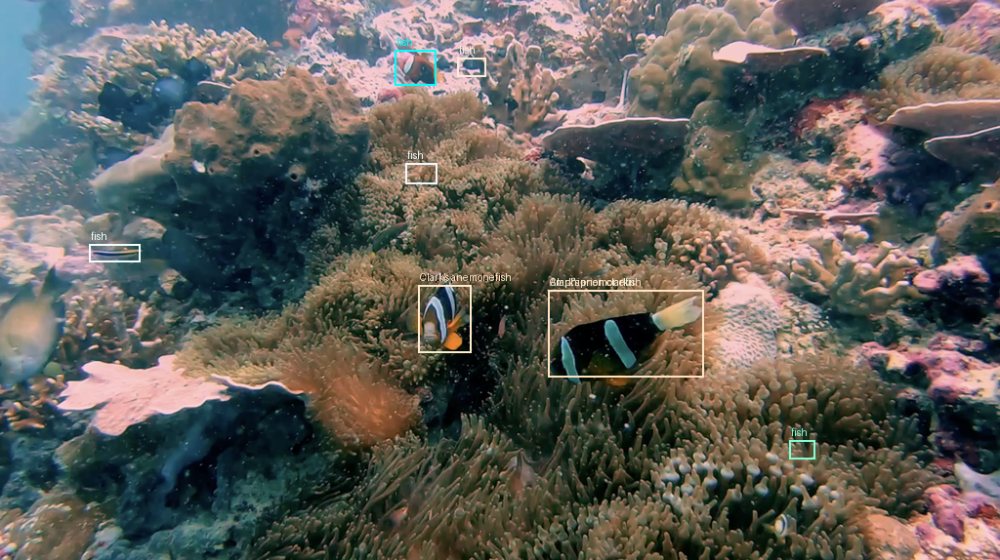

In [ ]:
plot_bounding_boxes(image, response.text)

It's not bad but not quite getting perfect labels with the various types of fish. Let's try by asking Gemini to label specific types of fish/corals in the image.

In [ ]:
response = client.models.generate_content(
    model=model_id,
    contents=[
        "Highlight the different corals in the image",
        image
    ],
    config=config
)

(1024, 574)


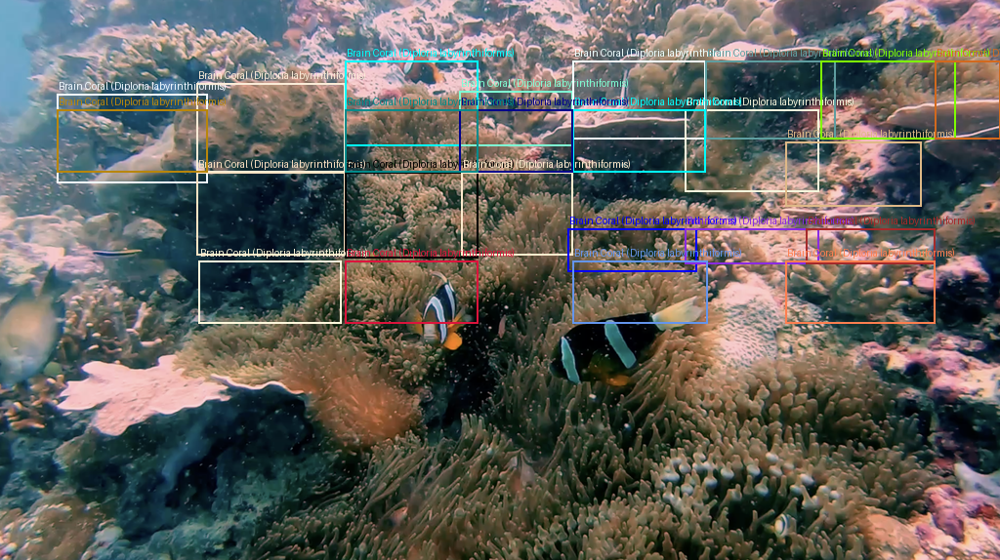

In [ ]:
plot_bounding_boxes(image, response.text)

(1024, 574)


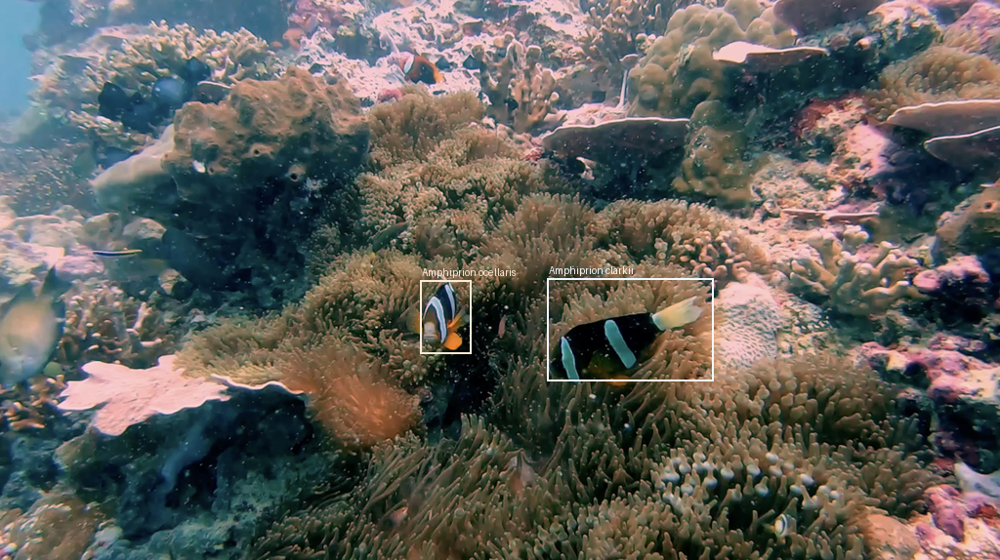

In [ ]:
response = client.models.generate_content(
    model=model_id,
    contents=[
        "Highlight the different clownfish in the image",
        image
    ],
    config=config
)
plot_bounding_boxes(image, response.text)

(1024, 574)


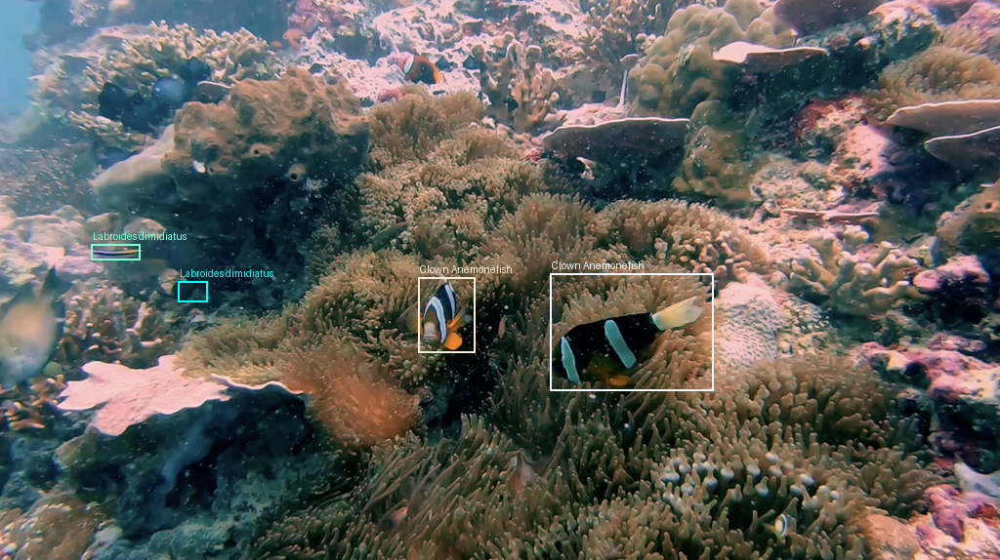

In [ ]:
response = client.models.generate_content(
    model=model_id,
    contents=[
        "Highlight any cleaner wrasse in this image",
        image
    ],
    config=config
)
plot_bounding_boxes(image, response.text)

Gemini occasionally manages to catch the wrasse to the left of the image, but not always. Gemini also struggles to _not_ highlight other fish and what seems to be a hallucination in the middle.

Let's try some more images:

(1024, 574)


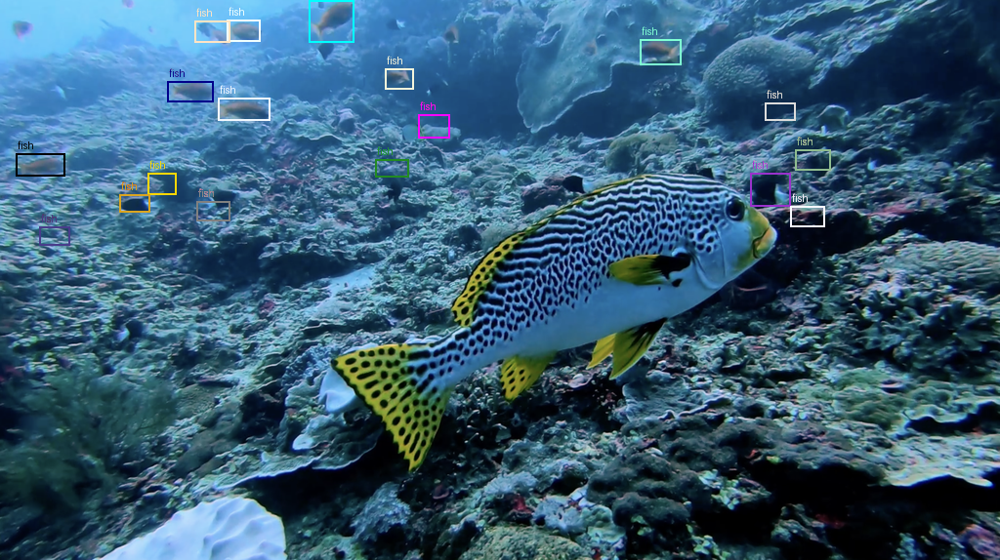

In [ ]:
with BytesIO(open(png_paths[1], "rb").read()) as img_bytes:
    # note: resizing is optional, but it helps with performance
    image = Image.open(img_bytes).resize(
        (1024, int(1024 * img.size[1] / img.size[0])),
        Image.Resampling.LANCZOS
    )

response = client.models.generate_content(
    model=model_id,
    contents=[
        "Highlight any fish in this image",
        image
    ],
    config=config
)
plot_bounding_boxes(image, response.text)

Interesting that it doesn't catch the very large fish in the middle of the image.

(1024, 574)


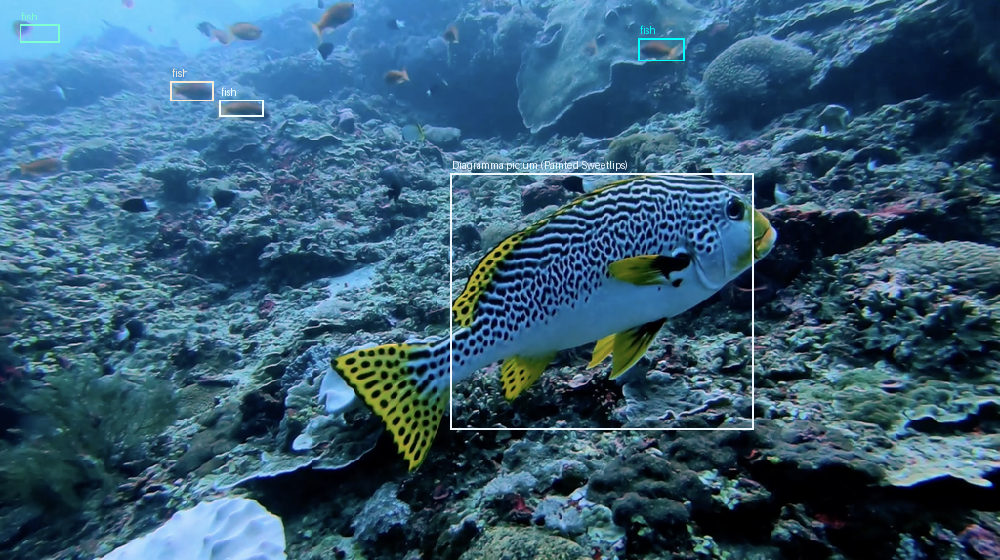

In [ ]:
response = client.models.generate_content(
    model=model_id,
    contents=[
        "What is the big fish in the middle of the image? Please highlight it.",
        image
    ],
    config=config
)
plot_bounding_boxes(image, response.text)

When specifying that we want to label the central fish, Gemini does seem to catch it and labelled it correctly as a _painted sweetlips_.

Let's try another image:

(1024, 574)


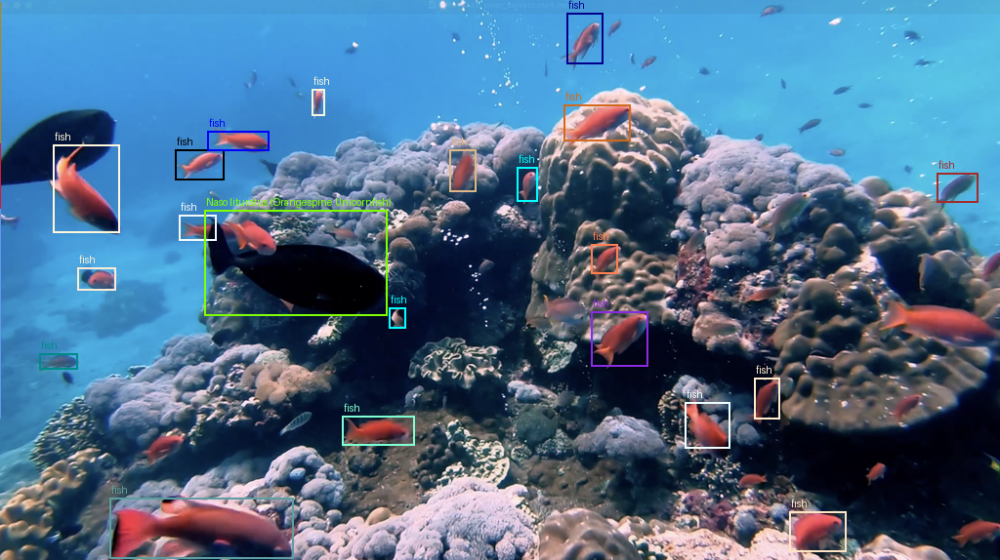

In [ ]:
with BytesIO(open(png_paths[2], "rb").read()) as img_bytes:
    # note: resizing is optional, but it helps with performance
    image = Image.open(img_bytes).resize(
        (1024, int(1024 * img.size[1] / img.size[0])),
        Image.Resampling.LANCZOS
    )

response = client.models.generate_content(
    model=model_id,
    contents=[
        "Highlight any fish in this image",
        image
    ],
    config=config
)
plot_bounding_boxes(image, response.text)

This is interesting. There are many fish in the image and Gemini catches plenty of them, the higher contrast likely helps. Nonetheless Gemini doesn't seem to like labeling most of them. However, it did label the unicornfish near the middle, it's not clear whether this is a perfect label as it may not specifically by an _orangespine_ unicornfish.

There are several interesting corals here too, let's see if Gemini can label them.

(1024, 574)


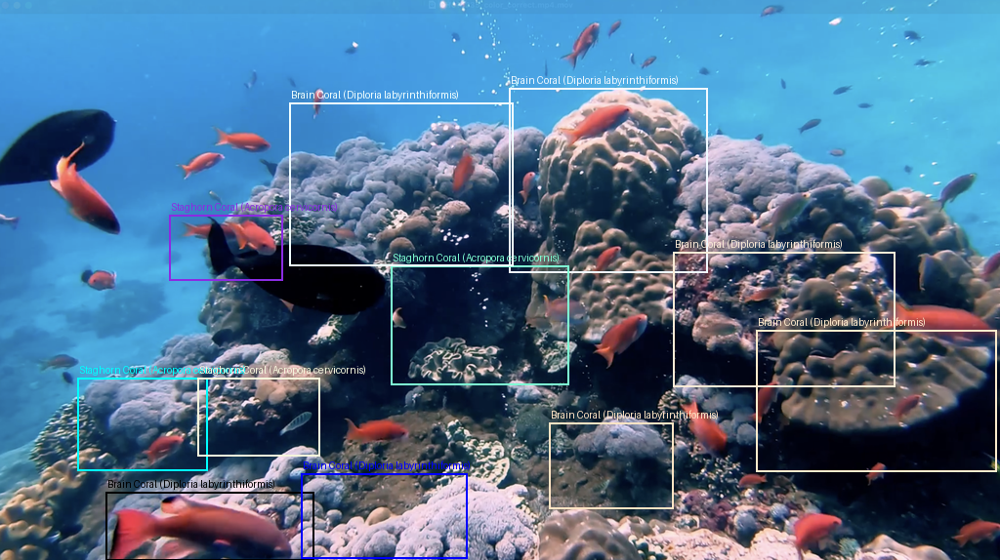

In [ ]:
with BytesIO(open(png_paths[2], "rb").read()) as img_bytes:
    # note: resizing is optional, but it helps with performance
    image = Image.open(img_bytes).resize(
        (1024, int(1024 * img.size[1] / img.size[0])),
        Image.Resampling.LANCZOS
    )

response = client.models.generate_content(
    model=model_id,
    contents=[
        "Highlight the corals in this image",
        image
    ],
    config=config
)
plot_bounding_boxes(image, response.text)

Again, not bad but not perfect. Let's try one final image:

(1024, 574)


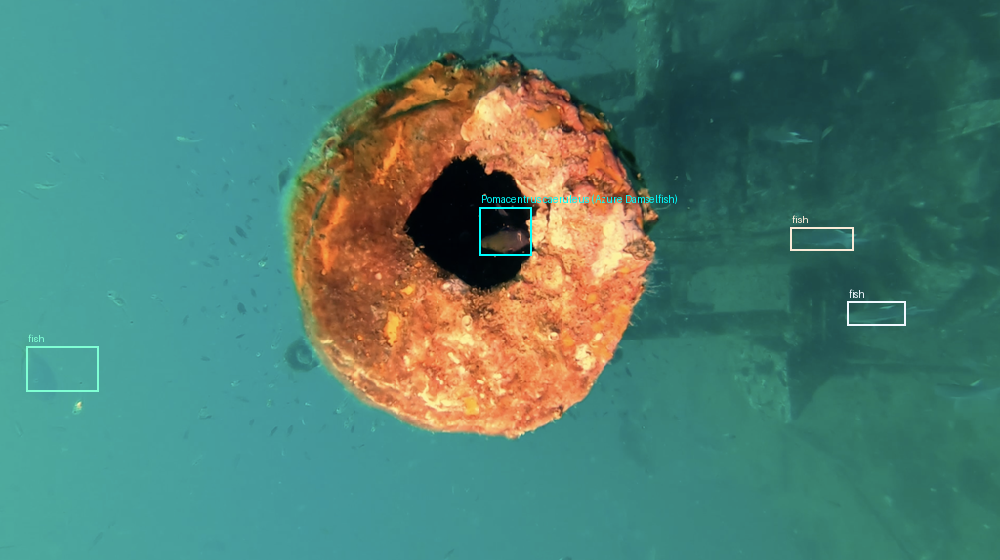

In [ ]:
with BytesIO(open(png_paths[3], "rb").read()) as img_bytes:
    # note: resizing is optional, but it helps with performance
    image = Image.open(img_bytes).resize(
        (1024, int(1024 * img.size[1] / img.size[0])),
        Image.Resampling.LANCZOS
    )

response = client.models.generate_content(
    model=model_id,
    contents=[
        "Where is the fish hiding in this image?",
        image
    ],
    config=config
)
plot_bounding_boxes(image, response.text)

Surprisingly, Gemini does a good job of highlighting a few almost hidden fish. The central fish is labeled as a _azure damselfish_. This label is close as the fish does seem to be a damselfish, but not quite an _azure_ damselfish.

Finally, let's ask Gemini to tell us what we're looking at with this final image.

In [ ]:
system_instruction = (
    "Describe what you see in this image, identify any fish or coral species "
    "in the image and tell us how many of each you can see."
)

config = types.GenerateContentConfig(
    system_instruction=system_instruction,
    temperature=0.1,
    safety_settings=safety_settings,
)

response = client.models.generate_content(
    model=model_id,
    contents=[
        "Explain what this image contains, what is happening, and what is the location?",
        image
    ],
    config=config
)

Markdown(response.text)

Certainly!

The image shows an underwater scene featuring a large, cylindrical object with a hole in the center. The object appears to be made of metal and is covered in marine growth, giving it a textured, orange-brown appearance. There are several small fish swimming around the object and in the background. The water is a clear, turquoise color.

Based on the appearance of the object and the surrounding environment, it is likely that this is a part of a shipwreck. The cylindrical object could be a gun barrel or a pipe from the ship. The presence of marine life indicates that the wreck has been underwater for some time, allowing coral and other organisms to grow on it.

The location is underwater, likely in a tropical or subtropical region, given the clear water and the type of marine life present.

In [ ]:
response = client.models.generate_content(
    model=model_id,
    contents=[
        "What is your best guess as to the exact location of this shipwreck?",
        image
    ],
    config=config
)

Markdown(response.text)

Certainly!

In the image, I see a section of a shipwreck underwater. The main focus is on a large, circular opening, possibly a gun port or a pipe, which is heavily encrusted with marine growth. The encrustation appears to be a mix of orange and white, suggesting the presence of coral or other marine organisms. The water is a clear, turquoise color, and there are numerous small fish swimming around the structure. The background shows more of the ship's structure, which is also covered in marine growth.

I can identify the following:

*   **Fish:** There are many small, silvery fish swimming around the structure. I can count at least 20 of these. There are also a few larger, darker fish, possibly jacks, visible in the background. I can count 3 of these.
*   **Coral/Marine Growth:** The orange and white encrustation on the circular opening appears to be a mix of coral and other marine growth. It's difficult to identify the specific species from the image.

I cannot determine the exact location of the shipwreck from the image alone. I can only describe what is visible in the provided image.

Okay so that's our intro to multi-modal text and image generation with Gemini 2.0 Flash. The model is already pretty impressive. There's certainly things to improve on and the latency leaves a lot to be desired, but it's nonetheless incredibly flexible and capable.

---